In [62]:
from google.colab import files
uploaded = files.upload()

Saving TestDataSet.zip to TestDataSet (1).zip


In [63]:
import zipfile
import os

zip_path = "/content/TestDataSet.zip"
extract_path = "/content/TestDataSet"

with zipfile.ZipFile(zip_path, 'r') as zip_ref:
    zip_ref.extractall(extract_path)

os.listdir(extract_path)

['TestDataSet', '__MACOSX']

## TASK-1

In [64]:
import torch
import torchvision.transforms as transforms
import torchvision.datasets as datasets
import torchvision.models as models
import numpy as np
from torch.utils.data import DataLoader
from tqdm import tqdm
import json
import os

mean_norms = np.array([0.485, 0.456, 0.406])
std_norms = np.array([0.229, 0.224, 0.225])

plain_transforms = transforms.Compose([
    transforms.ToTensor(),
    transforms.Normalize(mean=mean_norms, std=std_norms)
])

dataset_path = "/content/TestDataSet/TestDataSet"

with open(os.path.join(dataset_path, "labels_list.json"), 'r') as f:
    label_lines = json.load(f)

imagenet_labels = [int(line.split(":")[0]) for line in label_lines]
image_folder_dataset = datasets.ImageFolder(root=dataset_path, transform=plain_transforms)
idx_to_imagenet = {i: imagenet_labels[i] for i in range(len(imagenet_labels))}

class CorrectedLabelDataset(torch.utils.data.Dataset):
    def __init__(self, base_dataset, idx_to_label):
        self.base_dataset = base_dataset
        self.idx_to_label = idx_to_label
    def __len__(self):
        return len(self.base_dataset)
    def __getitem__(self, idx):
        image, folder_idx = self.base_dataset[idx]
        correct_label = self.idx_to_label[folder_idx]
        return image, int(correct_label)

corrected_dataset = CorrectedLabelDataset(image_folder_dataset, idx_to_imagenet)
test_loader = DataLoader(corrected_dataset, batch_size=32, shuffle=False)

device = torch.device("cuda" if torch.cuda.is_available() else "cpu")
model = models.resnet34(weights='IMAGENET1K_V1').to(device)
model.eval()

def topk_accuracy(output, target, topk=(1, 5)):
    maxk = max(topk)
    _, pred = output.topk(maxk, 1, True, True)
    pred = pred.t()
    correct = pred.eq(target.view(1, -1).expand_as(pred))
    return [correct[:k].reshape(-1).float().sum(0, keepdim=True).item() for k in topk]

top1_correct = 0
top5_correct = 0
total = 0

with torch.no_grad():
    for images, labels in tqdm(test_loader):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        top1, top5 = topk_accuracy(outputs, labels, topk=(1, 5))
        top1_correct += top1
        top5_correct += top5
        total += labels.size(0)

print("\n=== Task 1: ResNet-34 Clean Evaluation ===")
print(f"Top-1 Accuracy : {100 * top1_correct / total:.2f}%")
print(f"Top-5 Accuracy : {100 * top5_correct / total:.2f}%")
print("===========================================\n")

100%|██████████| 16/16 [00:00<00:00, 21.12it/s]


=== Task 1: ResNet-34 Clean Evaluation ===
Top-1 Accuracy : 76.00%
Top-5 Accuracy : 94.20%



In [65]:
with open(os.path.join(dataset_path, "labels_list.json"), 'r') as f:
    label_list = json.load(f)

print(label_list[:5])

['401: accordion', '402: acoustic guitar', '403: aircraft carrier', '404: airliner', '405: airship']


## TASK-2

In [66]:
import torch.nn as nn
import torchvision.utils as vutils
import os
from PIL import Image
from torchvision.transforms.functional import normalize

def unnormalize(tensor, mean, std):
    mean = torch.tensor(mean).reshape(1, 3, 1, 1).to(tensor.device)
    std = torch.tensor(std).reshape(1, 3, 1, 1).to(tensor.device)
    return tensor * std + mean

def renormalize(tensor, mean, std):
    mean = torch.tensor(mean).reshape(1, 3, 1, 1).to(tensor.device)
    std = torch.tensor(std).reshape(1, 3, 1, 1).to(tensor.device)
    return (tensor - mean) / std

adv_dir = "/content/Adversarial_Test_Set_1"
os.makedirs(adv_dir, exist_ok=True)

epsilon = 0.02
loss_fn = nn.CrossEntropyLoss()
adversarial_images = []
true_labels = []

for i, (images, labels) in enumerate(tqdm(test_loader)):
    images, labels = images.to(device), labels.to(device)
    images.requires_grad = True
    outputs = model(images)
    loss = loss_fn(outputs, labels)
    model.zero_grad()
    loss.backward()
    grad = images.grad.data

    images_unnorm = unnormalize(images, mean_norms, std_norms)
    adv_unnorm = images_unnorm + epsilon * grad.sign()
    adv_unnorm = torch.clamp(adv_unnorm, 0, 1)
    adv_images = renormalize(adv_unnorm, mean_norms, std_norms).float()

    adversarial_images.append(adv_images.detach().cpu())
    true_labels.append(labels.detach().cpu())

    for j in range(images.size(0)):
        raw_img = adv_unnorm[j].detach().cpu()
        vutils.save_image(raw_img, os.path.join(adv_dir, f"img_{i*32 + j}.png"))

adv_tensor = torch.cat(adversarial_images).float()
label_tensor = torch.cat(true_labels)
adv_dataset = torch.utils.data.TensorDataset(adv_tensor, label_tensor)
adv_loader = DataLoader(adv_dataset, batch_size=32, shuffle=False)

top1_correct = 0
top5_correct = 0
total = 0

with torch.no_grad():
    for images, labels in tqdm(adv_loader):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        top1, top5 = topk_accuracy(outputs, labels, topk=(1, 5))
        top1_correct += top1
        top5_correct += top5
        total += labels.size(0)

baseline_top1 = 76.00
baseline_top5 = 94.20
adv_top1 = 100 * top1_correct / total
adv_top5 = 100 * top5_correct / total
drop_top1 = baseline_top1 - adv_top1
drop_top5 = baseline_top5 - adv_top5

print("\n=== Task 2: FGSM Attack (ε = 0.02) ===")
print(f"Top-1 Accuracy : {adv_top1:.2f}%  (Drop Percentage: {drop_top1:.1f}%)")
print(f"Top-5 Accuracy : {adv_top5:.2f}%  (Drop Percentage: {drop_top5:.1f}%)")
print("=======================================\n")

100%|██████████| 16/16 [00:00<00:00, 76.39it/s]


=== Task 2: FGSM Attack (ε = 0.02) ===
Top-1 Accuracy : 3.80%  (Drop Percentage: 72.2%)
Top-5 Accuracy : 21.00%  (Drop Percentage: 73.2%)



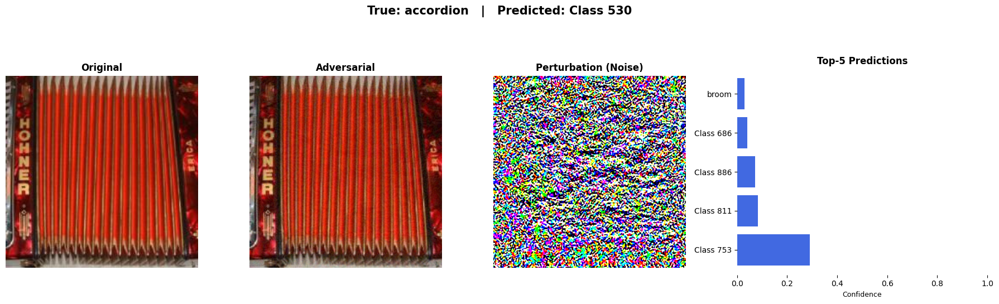

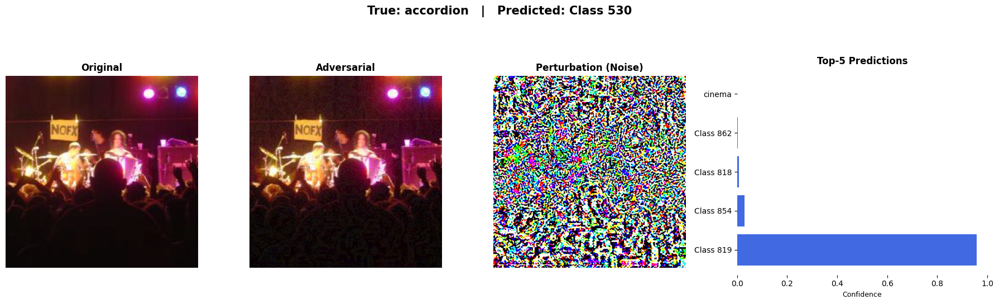

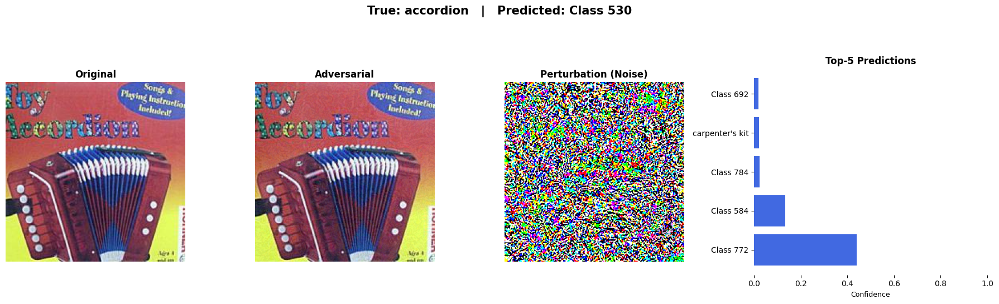

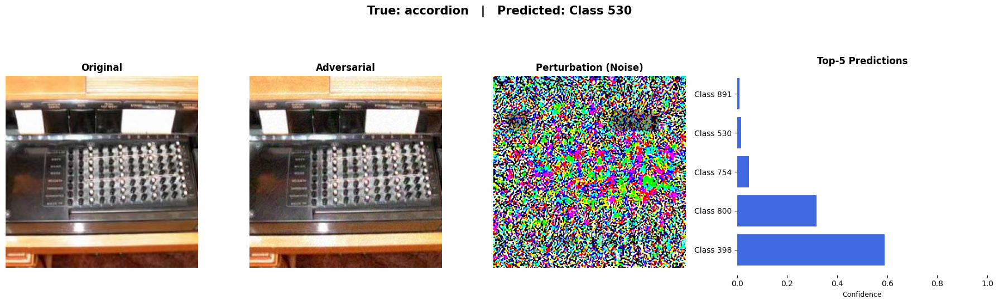

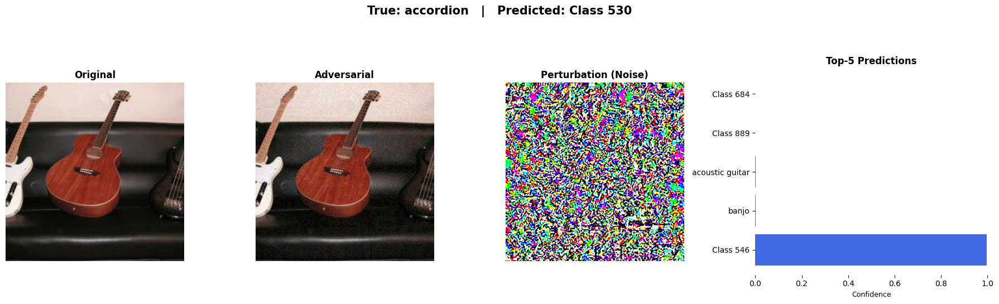

In [67]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import torch.nn.functional as F
import warnings

warnings.filterwarnings("ignore", category=UserWarning)

with open(os.path.join(dataset_path, "labels_list.json"), "r") as f:
    class_names = [line.split(":")[1].strip() for line in json.load(f)]

def unnormalize_img(tensor):
    return unnormalize(tensor.unsqueeze(0), mean_norms, std_norms).squeeze(0)

shown = 0
max_to_show = 5

for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    images.requires_grad = True

    outputs = model(images)
    loss = loss_fn(outputs, labels)
    model.zero_grad()
    loss.backward()
    grad = images.grad.data

    pixel_images = unnormalize(images, mean_norms, std_norms)
    adv_pixel = torch.clamp(pixel_images + epsilon * grad.sign(), 0, 1)
    adv_norm = renormalize(adv_pixel, mean_norms, std_norms).float()

    with torch.no_grad():
        logits = model(adv_norm)
        probs = F.softmax(logits, dim=1)
        preds = probs.argmax(dim=1)
        top5_vals, top5_classes = probs.topk(5, dim=1)

    for i in range(images.size(0)):
        if preds[i].item() != labels[i].item():
            orig_img = pixel_images[i].detach().cpu().permute(1, 2, 0)
            adv_img = adv_pixel[i].detach().cpu().permute(1, 2, 0)

            noise = (adv_pixel[i] - pixel_images[i]).detach().cpu()
            noise = (noise - noise.min()) / (noise.max() - noise.min() + 1e-8)
            noise = noise.permute(1, 2, 0)

            top5_probs = top5_vals[i].cpu().numpy()
            top5_indices = top5_classes[i].cpu().numpy()
            top5_labels = [class_names[c - 401] if 401 <= c <= 500 else f"Class {c}" for c in top5_indices]

            fig = plt.figure(figsize=(18, 5))
            gs = gridspec.GridSpec(1, 4, width_ratios=[1, 1, 1, 1.3])
            plt.subplots_adjust(wspace=0.7)

            ax0 = plt.subplot(gs[0])
            ax0.imshow(orig_img.numpy().clip(0, 1))
            ax0.set_title("Original", fontsize=12, fontweight='bold')
            ax0.axis('off')

            ax1 = plt.subplot(gs[1])
            ax1.imshow(adv_img.numpy().clip(0, 1))
            ax1.set_title("Adversarial", fontsize=12, fontweight='bold')
            ax1.axis('off')

            ax2 = plt.subplot(gs[2])
            ax2.imshow(noise.numpy(), cmap='gray')
            ax2.set_title("Perturbation (Noise)", fontsize=12, fontweight='bold')
            ax2.axis('off')

            ax3 = plt.subplot(gs[3])
            ax3.barh(range(5), top5_probs[::-1], color='royalblue')
            ax3.set_yticks(range(5))
            ax3.set_yticklabels(top5_labels[::-1], fontsize=10)
            ax3.set_xlim(0, 1.0)
            ax3.set_title("Top-5 Predictions", fontsize=12, fontweight='bold')
            ax3.set_xlabel("Confidence", fontsize=9)
            ax3.invert_yaxis()
            for spine in ax3.spines.values():
              spine.set_visible(False)

            true_label = class_names[true_id - 401] if 401 <= true_id <= 500 else f"Class {true_id}"
            pred_label = class_names[pred_id - 401] if 401 <= pred_id <= 500 else f"Class {pred_id}"
            fig.suptitle(f"True: {true_label}   |   Predicted: {pred_label}", fontsize=15, fontweight='bold', y=1.08)

            plt.tight_layout()
            plt.show()

            shown += 1
            if shown >= max_to_show:
                break
    if shown >= max_to_show:
        break

## TASK-3

In [68]:
pgd_eps = 0.02
pgd_alpha = 0.005
pgd_steps = 10
adv_dir_pgd = "/content/Adversarial_Test_Set_2"
os.makedirs(adv_dir_pgd, exist_ok=True)

adversarial_images_pgd = []
true_labels_pgd = []

for i, (images, labels) in enumerate(tqdm(test_loader)):
    images, labels = images.to(device), labels.to(device)
    images_unnorm = unnormalize(images, mean_norms, std_norms).clone().detach()
    images_adv = images_unnorm.clone().detach().requires_grad_(True)

    for step in range(pgd_steps):
        model.zero_grad()
        outputs = model(renormalize(images_adv, mean_norms, std_norms).float())
        loss = loss_fn(outputs, labels)
        loss.backward()
        grad = images_adv.grad.data
        images_adv = images_adv + pgd_alpha * grad.sign()
        images_adv = torch.max(torch.min(images_adv, images_unnorm + pgd_eps), images_unnorm - pgd_eps)
        images_adv = torch.clamp(images_adv, 0, 1).detach().requires_grad_(True)

    final_adv = renormalize(images_adv, mean_norms, std_norms).float()
    adversarial_images_pgd.append(final_adv.detach().cpu())
    true_labels_pgd.append(labels.detach().cpu())

    for j in range(images.size(0)):
        img = images_adv[j].detach().cpu()
        vutils.save_image(img, os.path.join(adv_dir_pgd, f"img_{i*32 + j}.png"))

adv_tensor_pgd = torch.cat(adversarial_images_pgd).float()
label_tensor_pgd = torch.cat(true_labels_pgd)
adv_dataset_pgd = torch.utils.data.TensorDataset(adv_tensor_pgd, label_tensor_pgd)
adv_loader_pgd = DataLoader(adv_dataset_pgd, batch_size=32, shuffle=False)

top1_correct = 0
top5_correct = 0
total = 0

with torch.no_grad():
    for images, labels in tqdm(adv_loader_pgd):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        top1, top5 = topk_accuracy(outputs, labels, topk=(1, 5))
        top1_correct += top1
        top5_correct += top5
        total += labels.size(0)

baseline_top1 = 76.00
baseline_top5 = 94.20
adv_top1 = 100 * top1_correct / total
adv_top5 = 100 * top5_correct / total
drop_top1 = baseline_top1 - adv_top1
drop_top5 = baseline_top5 - adv_top5

print("\n=== Task 3: PGD Attack (ε = 0.02, α = 0.005, steps = 10) ===")
print(f"Top-1 Accuracy : {adv_top1:.2f}%  (Drop Percentage: {drop_top1:.1f}%)")
print(f"Top-5 Accuracy : {adv_top5:.2f}%  (Drop Percentage: {drop_top5:.1f}%)")
print("============================================================\n")

100%|██████████| 16/16 [00:00<00:00, 84.87it/s]


=== Task 3: PGD Attack (ε = 0.02, α = 0.005, steps = 10) ===
Top-1 Accuracy : 0.00%  (Drop Percentage: 76.0%)
Top-5 Accuracy : 1.40%  (Drop Percentage: 92.8%)



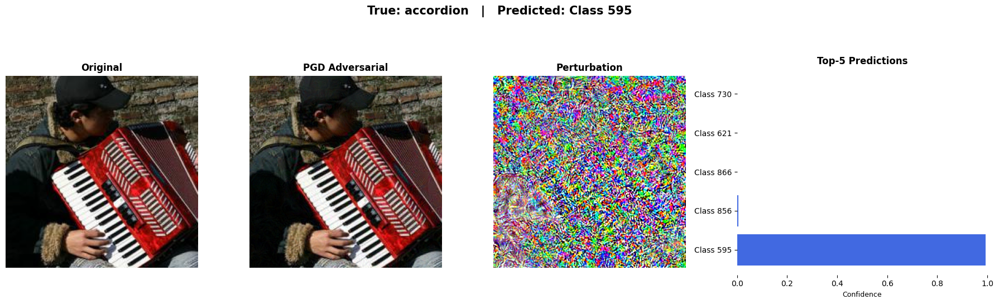

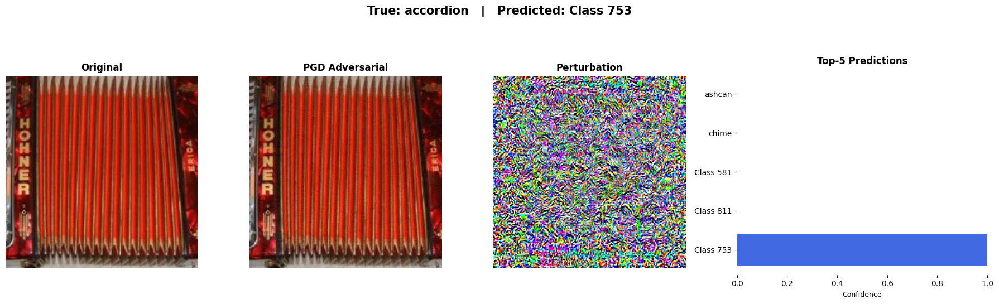

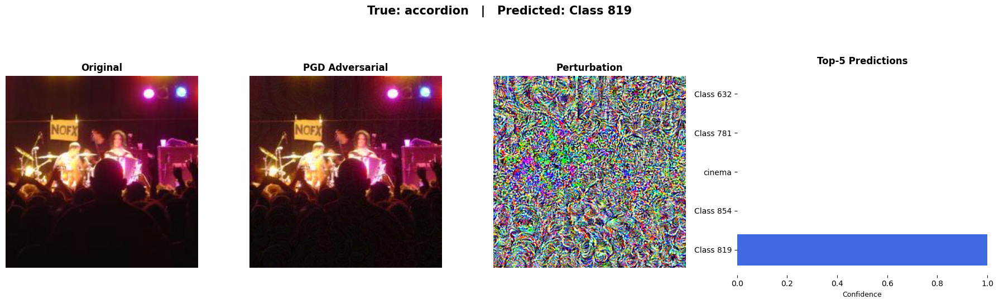

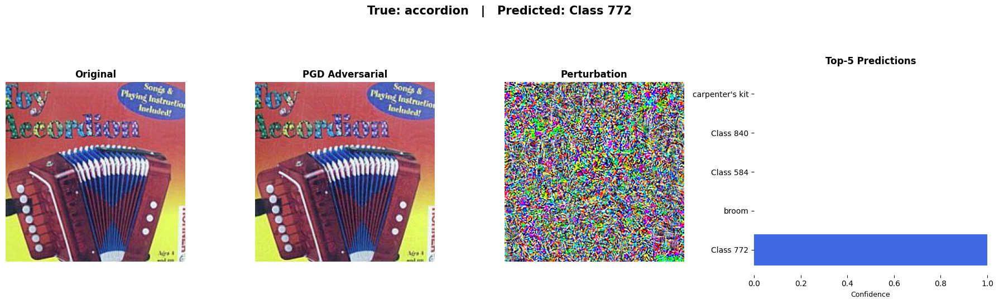

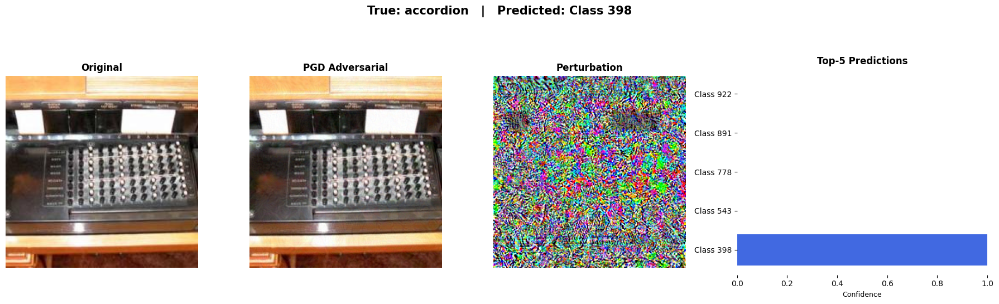

In [69]:
import matplotlib.pyplot as plt
import matplotlib.gridspec as gridspec
import torch.nn.functional as F

shown = 0
max_to_show = 5

for images, labels in test_loader:
    images, labels = images.to(device), labels.to(device)
    images_unnorm = unnormalize(images, mean_norms, std_norms).clone().detach()
    images_adv = images_unnorm.clone().detach().requires_grad_(True)

    for step in range(pgd_steps):
        model.zero_grad()
        outputs = model(renormalize(images_adv, mean_norms, std_norms).float())
        loss = loss_fn(outputs, labels)
        loss.backward()
        grad = images_adv.grad.data
        images_adv = images_adv + pgd_alpha * grad.sign()
        images_adv = torch.max(torch.min(images_adv, images_unnorm + pgd_eps), images_unnorm - pgd_eps)
        images_adv = torch.clamp(images_adv, 0, 1).detach().requires_grad_(True)

    with torch.no_grad():
        final_outputs = model(renormalize(images_adv, mean_norms, std_norms).float())
        preds = final_outputs.argmax(dim=1)

    for i in range(images.size(0)):
        if preds[i].item() != labels[i].item():
            orig_img = unnormalize(images[i].unsqueeze(0), mean_norms, std_norms).squeeze(0).detach().cpu()
            adv_img = images_adv[i].detach().cpu()
            noise = (adv_img - orig_img).detach().cpu()
            noise_norm = (noise - noise.min()) / (noise.max() - noise.min())

            probs = F.softmax(final_outputs[i], dim=0)
            top5_vals, top5_idxs = torch.topk(probs, 5)
            top5_probs = top5_vals.cpu().numpy()
            top5_labels = [
                class_names[idx.item() - 401] if 401 <= idx.item() <= 500 else f"Class {idx.item()}"
                for idx in top5_idxs
            ]

            fig = plt.figure(figsize=(18, 5))
            gs = gridspec.GridSpec(1, 4, width_ratios=[1, 1, 1, 1.3])
            plt.subplots_adjust(wspace=0.7)

            ax0 = plt.subplot(gs[0])
            ax0.imshow(orig_img.permute(1, 2, 0).numpy().clip(0, 1))
            ax0.set_title("Original", fontsize=12, fontweight='bold')
            ax0.axis('off')

            ax1 = plt.subplot(gs[1])
            ax1.imshow(adv_img.permute(1, 2, 0).numpy().clip(0, 1))
            ax1.set_title("PGD Adversarial", fontsize=12, fontweight='bold')
            ax1.axis('off')

            ax2 = plt.subplot(gs[2])
            ax2.imshow(noise_norm.permute(1, 2, 0).numpy(), cmap='gray')
            ax2.set_title("Perturbation", fontsize=12, fontweight='bold')
            ax2.axis('off')

            ax3 = plt.subplot(gs[3])
            ax3.barh(range(5), top5_probs[::-1], color='royalblue')
            ax3.set_yticks(range(5))
            ax3.set_yticklabels(top5_labels[::-1], fontsize=10)
            ax3.set_xlim(0, 1.0)
            ax3.set_title("Top-5 Predictions", fontsize=12, fontweight='bold')
            ax3.set_xlabel("Confidence", fontsize=9)
            ax3.invert_yaxis()
            for spine in ax3.spines.values():
                spine.set_visible(False)

            true_id = labels[i].item()
            pred_id = preds[i].item()
            true_label = class_names[true_id - 401] if 401 <= true_id <= 500 else f"Class {true_id}"
            pred_label = class_names[pred_id - 401] if 401 <= pred_id <= 500 else f"Class {pred_id}"
            fig.suptitle(f"True: {true_label}   |   Predicted: {pred_label}", fontsize=15, fontweight='bold', y=1.08)

            plt.tight_layout()
            plt.show()

            shown += 1
            if shown >= max_to_show:
                break
    if shown >= max_to_show:
        break

## TASK-4

In [70]:
patch_eps = 0.5
patch_alpha = 0.12
patch_size = 32
pgd_steps = 20

adv_dir_patch = "/content/Adversarial_Test_Set_3"
os.makedirs(adv_dir_patch, exist_ok=True)

adversarial_images_patch = []
true_labels_patch = []

for i, (images, labels) in enumerate(tqdm(test_loader)):
    images, labels = images.to(device), labels.to(device)
    images_unnorm = unnormalize(images, mean_norms, std_norms).clone().detach()
    B, C, H, W = images_unnorm.shape

    x_start = H // 2 - patch_size // 2
    y_start = W // 2 - patch_size // 2

    images_adv = images_unnorm.clone().detach().requires_grad_(True)
    momentum = torch.zeros_like(images_adv).to(device)

    for step in range(pgd_steps):
        model.zero_grad()
        outputs = model(renormalize(images_adv, mean_norms, std_norms).float())
        loss = loss_fn(outputs, labels)
        loss.backward()
        grad = images_adv.grad.data

        grad_patch = grad[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size]
        grad_patch_norm = grad_patch / (grad_patch.abs().mean(dim=(1, 2, 3), keepdim=True) + 1e-8)

        momentum[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size] = \
            0.9 * momentum[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size] + grad_patch_norm

        perturb = torch.zeros_like(images_adv).to(device)
        perturb[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size] = \
            patch_alpha * momentum[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size].sign()

        images_adv = images_adv + perturb
        images_adv = torch.max(torch.min(images_adv, images_unnorm + patch_eps), images_unnorm - patch_eps)
        images_adv = torch.clamp(images_adv, 0, 1).detach().requires_grad_(True)

    final_adv = renormalize(images_adv, mean_norms, std_norms).float()
    adversarial_images_patch.append(final_adv.detach().cpu())
    true_labels_patch.append(labels.detach().cpu())

    for j in range(images.size(0)):
        raw_img = images_adv[j].detach().cpu()
        vutils.save_image(raw_img, os.path.join(adv_dir_patch, f"img_{i*32 + j}.png"))

adv_tensor_patch = torch.cat(adversarial_images_patch).float()
label_tensor_patch = torch.cat(true_labels_patch)
adv_dataset_patch = torch.utils.data.TensorDataset(adv_tensor_patch, label_tensor_patch)
adv_loader_patch = DataLoader(adv_dataset_patch, batch_size=32, shuffle=False)

top1_correct = 0
top5_correct = 0
total = 0

with torch.no_grad():
    for images, labels in tqdm(adv_loader_patch):
        images, labels = images.to(device), labels.to(device)
        outputs = model(images)
        top1, top5 = topk_accuracy(outputs, labels, topk=(1, 5))
        top1_correct += top1
        top5_correct += top5
        total += labels.size(0)

baseline_top1 = 76.00
baseline_top5 = 94.20
adv_top1 = 100 * top1_correct / total
adv_top5 = 100 * top5_correct / total
drop_top1 = baseline_top1 - adv_top1
drop_top5 = baseline_top5 - adv_top5

print(f"\n=== Task 4: Patch Attack (ε = {patch_eps}, α = {patch_alpha}, steps = {pgd_steps}, patch = {patch_size}×{patch_size}) ===")
print(f"Top-1 Accuracy : {adv_top1:.2f}%  (Drop Percentage: {drop_top1:.1f}%)")
print(f"Top-5 Accuracy : {adv_top5:.2f}%  (Drop Percentage: {drop_top5:.1f}%)")
print("==============================================================================================\n")

100%|██████████| 16/16 [00:00<00:00, 78.70it/s]


=== Task 4: Patch Attack (ε = 0.5, α = 0.12, steps = 20, patch = 32×32) ===
Top-1 Accuracy : 4.80%  (Drop Percentage: 71.2%)
Top-5 Accuracy : 34.40%  (Drop Percentage: 59.8%)



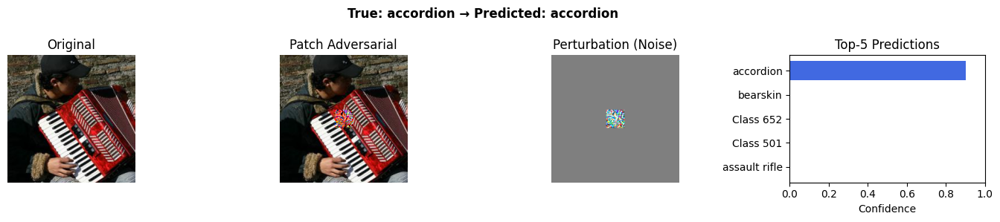

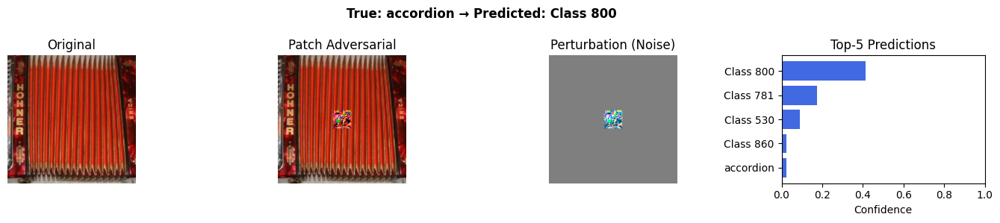

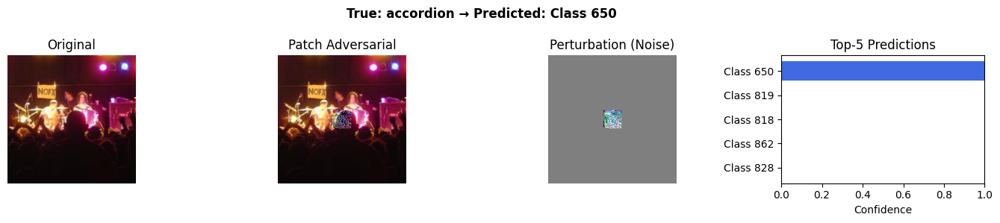

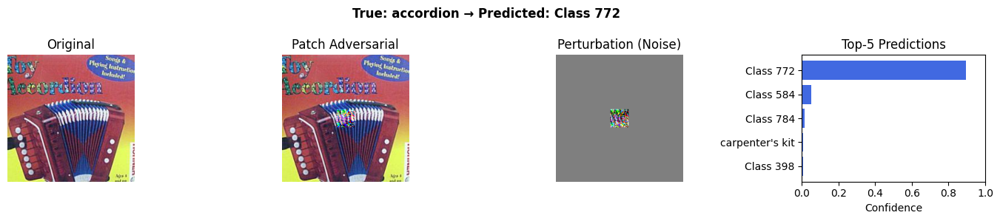

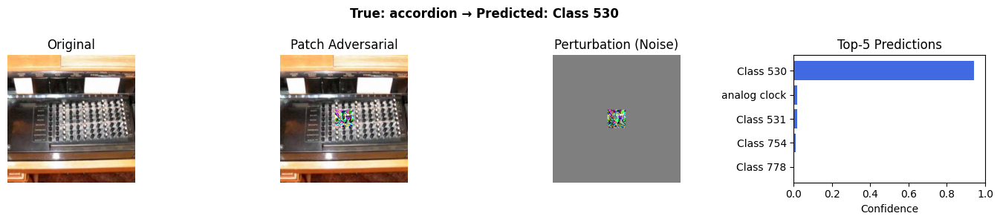

In [71]:
import matplotlib.pyplot as plt
import torch.nn.functional as F

shown = 0
max_to_show = 5

for images, labels in test_loader:
    if shown >= max_to_show:
        break

    images = images.to(device)
    labels = labels.to(device)
    images_unnorm = unnormalize(images, mean_norms, std_norms).detach()
    images_adv = images_unnorm.clone().detach().requires_grad_(True)

    B, C, H, W = images_unnorm.shape
    x_start = H // 2 - patch_size // 2
    y_start = W // 2 - patch_size // 2
    momentum = torch.zeros_like(images_adv).to(device)

    for step in range(pgd_steps):
        model.zero_grad()
        outputs = model(renormalize(images_adv, mean_norms, std_norms).float())
        loss = loss_fn(outputs, labels)
        loss.backward()
        grad = images_adv.grad.data

        grad_patch = grad[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size]
        grad_patch_norm = grad_patch / (grad_patch.abs().mean(dim=(1, 2, 3), keepdim=True) + 1e-8)

        momentum[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size] = \
            0.9 * momentum[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size] + grad_patch_norm

        perturb = torch.zeros_like(images_adv).to(device)
        perturb[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size] = \
            patch_alpha * momentum[:, :, x_start:x_start+patch_size, y_start:y_start+patch_size].sign()

        images_adv = images_adv + perturb
        images_adv = torch.max(torch.min(images_adv, images_unnorm + patch_eps), images_unnorm - patch_eps)
        images_adv = torch.clamp(images_adv, 0, 1).detach().requires_grad_(True)

    with torch.no_grad():
      outputs = model(renormalize(images_adv, mean_norms, std_norms).float())
      preds = outputs.argmax(dim=1)
      probs = F.softmax(outputs, dim=1)

    for i in range(images.size(0)):
        if shown >= max_to_show:
            break

        orig = images_unnorm[i].cpu().permute(1, 2, 0).numpy().clip(0, 1)
        adv = images_adv[i].cpu().detach().permute(1, 2, 0).numpy().clip(0, 1)

        noise_patch = (images_adv[i] - images_unnorm[i]).cpu().detach()
        noise_patch = (noise_patch - noise_patch.min()) / (noise_patch.max() - noise_patch.min() + 1e-8)
        noise = torch.ones_like(noise_patch) * 0.5
        noise[:, x_start:x_start+patch_size, y_start:y_start+patch_size] = noise_patch[:, x_start:x_start+patch_size, y_start:y_start+patch_size]
        noise_img = noise.permute(1, 2, 0).numpy()

        top5_probs, top5_idxs = probs[i].topk(5)
        top5_labels = [class_names[idx.item() - 401] if 401 <= idx.item() <= 500 else f"Class {idx.item()}" for idx in top5_idxs]

        true_id = labels[i].item()
        pred_id = preds[i].item()
        true_label = class_names[true_id - 401] if 401 <= true_id <= 500 else f"Class {true_id}"
        pred_label = class_names[pred_id - 401] if 401 <= pred_id <= 500 else f"Class {pred_id}"

        fig = plt.figure(figsize=(14, 3))
        plt.suptitle(f"True: {true_label} → Predicted: {pred_label}", fontsize=12, weight='bold')

        ax0 = plt.subplot(1, 4, 1)
        ax0.imshow(orig)
        ax0.set_title("Original")
        ax0.axis('off')

        ax1 = plt.subplot(1, 4, 2)
        ax1.imshow(adv)
        ax1.set_title("Patch Adversarial")
        ax1.axis('off')

        ax2 = plt.subplot(1, 4, 3)
        ax2.imshow(noise_img)
        ax2.set_title("Perturbation (Noise)")
        ax2.axis('off')

        ax3 = plt.subplot(1, 4, 4)
        ax3.barh(top5_labels[::-1], top5_probs.cpu().numpy()[::-1], color="royalblue")
        ax3.set_xlim(0, 1)
        ax3.set_title("Top-5 Predictions")
        ax3.set_xlabel("Confidence")

        plt.tight_layout()
        plt.show()

        shown += 1

ResNet-34 SUMMARY TABLE

In [72]:
from tabulate import tabulate

original_top1 = 76.00
original_top5 = 94.20

fgsm_top1 = 3.80
fgsm_top5 = 21.00
fgsm_drop1 = original_top1 - fgsm_top1
fgsm_drop5 = original_top5 - fgsm_top5

pgd_top1 = 0.00
pgd_top5 = 1.40
pgd_drop1 = original_top1 - pgd_top1
pgd_drop5 = original_top5 - pgd_top5

patch_top1 = 4.80
patch_top5 = 34.40
patch_drop1 = original_top1 - patch_top1
patch_drop5 = original_top5 - patch_top5

summary = [
    ["Original", original_top1, original_top5, 0.0, 0.0],
    ["FGSM", fgsm_top1, fgsm_top5, fgsm_drop1, fgsm_drop5],
    ["PGD", pgd_top1, pgd_top5, pgd_drop1, pgd_drop5],
    ["Patch", patch_top1, patch_top5, patch_drop1, patch_drop5],
]

headers = ["Task", "Top-1 Accuracy (%)", "Top-5 Accuracy (%)", "Top-1 Drop (%)", "Top-5 Drop (%)"]

print("\n=== Final Summary Table ===")
print(tabulate(summary, headers=headers, tablefmt="plain"))


=== Final Summary Table ===
Task        Top-1 Accuracy (%)    Top-5 Accuracy (%)    Top-1 Drop (%)    Top-5 Drop (%)
Original                  76                    94.2               0                 0
FGSM                       3.8                  21                72.2              73.2
PGD                        0                     1.4              76                92.8
Patch                      4.8                  34.4              71.2              59.8


## TASK-5

In [73]:
import torchvision.models as models
import torch.nn.functional as F
from tqdm import tqdm

densenet = models.densenet121(weights='IMAGENET1K_V1').to(device)
densenet.eval()

def evaluate_accuracy(dataloader):
    top1_correct = 0
    top5_correct = 0
    total = 0

    with torch.no_grad():
        for images, labels in tqdm(dataloader):
            images, labels = images.to(device), labels.to(device)
            outputs = densenet(images)
            top1, top5 = topk_accuracy(outputs, labels, topk=(1, 5))
            top1_correct += top1
            top5_correct += top5
            total += labels.size(0)

    top1_acc = 100 * top1_correct / total
    top5_acc = 100 * top5_correct / total
    return top1_acc, top5_acc

clean_top1, clean_top5 = evaluate_accuracy(test_loader)
fgsm_top1, fgsm_top5 = evaluate_accuracy(adv_loader)
pgd_top1, pgd_top5 = evaluate_accuracy(adv_loader_pgd)
patch_top1, patch_top5 = evaluate_accuracy(adv_loader_patch)

fgsm_drop1 = clean_top1 - fgsm_top1
fgsm_drop5 = clean_top5 - fgsm_top5

pgd_drop1 = clean_top1 - pgd_top1
pgd_drop5 = clean_top5 - pgd_top5

patch_drop1 = clean_top1 - patch_top1
patch_drop5 = clean_top5 - patch_top5

from tabulate import tabulate

summary = [
    ["Clean", clean_top1, clean_top5, 0.0, 0.0],
    ["FGSM", fgsm_top1, fgsm_top5, fgsm_drop1, fgsm_drop5],
    ["PGD", pgd_top1, pgd_top5, pgd_drop1, pgd_drop5],
    ["Patch", patch_top1, patch_top5, patch_drop1, patch_drop5],
]

headers = ["Dataset", "Top-1 Accuracy (%)", "Top-5 Accuracy (%)", "Top-1 Drop (%)", "Top-5 Drop (%)"]

print("\n=== Task 5: Transferability to DenseNet-121 ===")
print(tabulate(summary, headers=headers, tablefmt="github"))

100%|██████████| 16/16 [00:00<00:00, 40.00it/s]


=== Task 5: Transferability to DenseNet-121 ===
| Dataset   |   Top-1 Accuracy (%) |   Top-5 Accuracy (%) |   Top-1 Drop (%) |   Top-5 Drop (%) |
|-----------|----------------------|----------------------|------------------|------------------|
| Clean     |                 74.6 |                 93.6 |              0   |              0   |
| FGSM      |                 45.8 |                 75.8 |             28.8 |             17.8 |
| PGD       |                 40   |                 76.6 |             34.6 |             17   |
| Patch     |                 66.6 |                 89.4 |              8   |              4.2 |


In [74]:
print(f"Original Test Set Size: {len(test_loader.dataset)}")
print(f"FGSM Test Set Size: {len(adv_loader)} batches of size 32 → {len(adv_loader.dataset)} images")
print(f"PGD Test Set Size: {len(adv_loader_pgd)} batches of size 32 → {len(adv_loader_pgd.dataset)} images")
print(f"Patch Test Set Size: {len(adv_loader_patch)} batches of size 32 → {len(adv_loader_patch.dataset)} images")

Original Test Set Size: 500
FGSM Test Set Size: 16 batches of size 32 → 500 images
PGD Test Set Size: 16 batches of size 32 → 500 images
Patch Test Set Size: 16 batches of size 32 → 500 images


ResNetT-34 v/s DenseNet-121 SUMMARY TABLE

In [75]:
from tabulate import tabulate

resnet_summary = {
    "Original": (76.00, 94.20),
    "FGSM": (3.80, 21.00),
    "PGD": (0.00, 1.40),
    "Patch": (4.80, 34.40),
}

densenet_summary = {
    "Original": (74.60, 93.60),
    "FGSM": (45.80, 75.80),
    "PGD": (40.00, 76.60),
    "Patch": (66.60, 89.40),
}

combined_summary = []
for task in ["Original", "FGSM", "PGD", "Patch"]:
    r1, r5 = resnet_summary[task]
    d1, d5 = densenet_summary[task]
    r1_drop = resnet_summary["Original"][0] - r1
    r5_drop = resnet_summary["Original"][1] - r5
    d1_drop = densenet_summary["Original"][0] - d1
    d5_drop = densenet_summary["Original"][1] - d5
    combined_summary.append([
        task,
        f"{r1:.1f}", f"{r5:.1f}", f"{r1_drop:.1f}", f"{r5_drop:.1f}",
        f"{d1:.1f}", f"{d5:.1f}", f"{d1_drop:.1f}", f"{d5_drop:.1f}"
    ])

headers = [
    "Task",
    "ResNet-34 Top-1", "Top-5", "Drop-1", "Drop-5",
    "DenseNet-121 Top-1", "Top-5", "Drop-1", "Drop-5"
]

print("\n=== Final Summary Table: ResNet-34 vs DenseNet-121 ===")
print(tabulate(combined_summary, headers=headers, tablefmt="github"))


=== Final Summary Table: ResNet-34 vs DenseNet-121 ===
| Task     |   ResNet-34 Top-1 |   Top-5 |   Drop-1 |   Drop-5 |   DenseNet-121 Top-1 |   Top-5 |   Drop-1 |   Drop-5 |
|----------|-------------------|---------|----------|----------|----------------------|---------|----------|----------|
| Original |              76   |    94.2 |      0   |      0   |                 74.6 |    93.6 |      0   |      0   |
| FGSM     |               3.8 |    21   |     72.2 |     73.2 |                 45.8 |    75.8 |     28.8 |     17.8 |
| PGD      |               0   |     1.4 |     76   |     92.8 |                 40   |    76.6 |     34.6 |     17   |
| Patch    |               4.8 |    34.4 |     71.2 |     59.8 |                 66.6 |    89.4 |      8   |      4.2 |


Accuracy Comparison PLOT

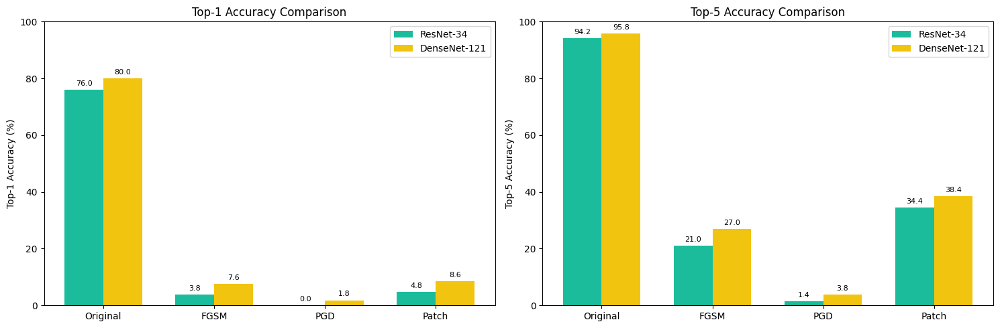

In [76]:
import matplotlib.pyplot as plt
import numpy as np

tasks = ['Original', 'FGSM', 'PGD', 'Patch']

resnet_top1 = [76.00, 3.80, 0.00, 4.80]
resnet_top5 = [94.20, 21.00, 1.40, 34.40]

densenet_top1 = [80.00, 7.60, 1.80, 8.60]
densenet_top5 = [95.80, 27.00, 3.80, 38.40]

x = np.arange(len(tasks))
width = 0.35

fig, (ax1, ax2) = plt.subplots(1, 2, figsize=(15, 5))

colors_resnet = ['#1abc9c'] * 4  # Teal
colors_densenet = ['#f1c40f'] * 4  # Gold

bars1 = ax1.bar(x - width/2, resnet_top1, width, label='ResNet-34', color=colors_resnet)
bars2 = ax1.bar(x + width/2, densenet_top1, width, label='DenseNet-121', color=colors_densenet)
ax1.set_ylabel('Top-1 Accuracy (%)')
ax1.set_title('Top-1 Accuracy Comparison')
ax1.set_xticks(x)
ax1.set_xticklabels(tasks)
ax1.set_ylim(0, 100)
ax1.legend()

for bar in bars1 + bars2:
    height = bar.get_height()
    ax1.annotate(f'{height:.1f}',
                 xy=(bar.get_x() + bar.get_width() / 2, height),
                 xytext=(0, 3),
                 textcoords="offset points",
                 ha='center', va='bottom', fontsize=8)

bars3 = ax2.bar(x - width/2, resnet_top5, width, label='ResNet-34', color=colors_resnet)
bars4 = ax2.bar(x + width/2, densenet_top5, width, label='DenseNet-121', color=colors_densenet)
ax2.set_ylabel('Top-5 Accuracy (%)')
ax2.set_title('Top-5 Accuracy Comparison')
ax2.set_xticks(x)
ax2.set_xticklabels(tasks)
ax2.set_ylim(0, 100)
ax2.legend()

for bar in bars3 + bars4:
    height = bar.get_height()
    ax2.annotate(f'{height:.1f}',
                 xy=(bar.get_x() + bar.get_width() / 2, height),
                 xytext=(0, 3),
                 textcoords="offset points",
                 ha='center', va='bottom', fontsize=8)

plt.tight_layout()
plt.show()

Heatmap for Accuracy Drop across attacks (in %)

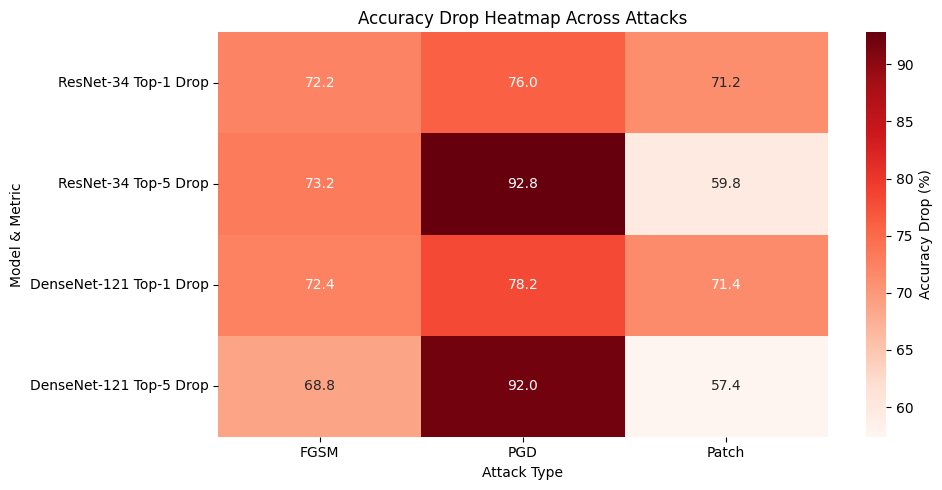

In [77]:
import matplotlib.pyplot as plt
import seaborn as sns
import numpy as np

tasks = ['FGSM', 'PGD', 'Patch']

resnet_top1_drop = [72.20, 76.00, 71.20]
resnet_top5_drop = [73.20, 92.80, 59.80]
densenet_top1_drop = [72.40, 78.20, 71.40]
densenet_top5_drop = [68.80, 92.00, 57.40]

drop_data = np.array([
    resnet_top1_drop,
    resnet_top5_drop,
    densenet_top1_drop,
    densenet_top5_drop
])

model_labels = ['ResNet-34 Top-1 Drop', 'ResNet-34 Top-5 Drop', 'DenseNet-121 Top-1 Drop', 'DenseNet-121 Top-5 Drop']

plt.figure(figsize=(10, 5))
sns.heatmap(drop_data, annot=True, fmt=".1f", cmap="Reds", xticklabels=tasks, yticklabels=model_labels, cbar_kws={'label': 'Accuracy Drop (%)'})
plt.title("Accuracy Drop Heatmap Across Attacks")
plt.xlabel("Attack Type")
plt.ylabel("Model & Metric")
plt.tight_layout()
plt.show()

OBSERVATIONS and FINDINGS:

	•	Adversarial attacks definitely transfer between models. Even though we crafted the attacks using ResNet-34, DenseNet-121’s accuracy dropped significantly when tested on the same perturbed images.
	•	PGD was by far the most effective attack. It caused the biggest drop in both top-1 and top-5 accuracy. No surprise — it’s multi-step and iterative, so it fine-tunes the perturbation more precisely.
	•	FGSM didn’t hit as hard. It still fooled the model, but the drop in accuracy wasn’t as steep. It’s a fast, one-step method, so while it works, it’s less aggressive.
	•	Patch attacks were surprisingly strong. Even though we only altered a small 32x32 area of each image, they still managed to mess with predictions. This shows how sensitive these models are to localized changes.
	•	Transferability isn’t perfectly equal across models — DenseNet-121 handled the attacks a bit better than ResNet-34 in some cases, but it was still clearly vulnerable.

TRENDS:

	.	The stronger the attack, the harder the fall.
    PGD was by far the most damaging — probably because it takes multiple steps to craft the attack. FGSM, being a quick one-step method, didn’t shake the model as much, and the patch attack landed somewhere in the middle.
	.	Top-5 accuracy didn’t drop as badly.
    Even when the model got the top prediction wrong, it still had the right answer somewhere in the top 5. That suggests it wasn’t completely clueless — just a bit confused.
	.	DenseNet-121 handled the pressure a bit better.
    Across all the adversarial datasets, DenseNet-121 performed slightly better than ResNet-34. It wasn’t immune, but it definitely held its ground a little more.
	.	Attacks are very much transferable.
    What fooled ResNet-34 almost always fooled DenseNet-121 too. This just shows that adversarial patterns aren’t unique to one model — once you find a weak spot, you can hit others in the same place.
	.	Small patches can do big damage.
    It was interesting to see that even though patch attacks only touch a small 32×32 region, they still threw off the model. So yeah — a little mischief goes a long way.

Lessons Learned (TASK-5):

	•	Not all models crack the same way
    Turns out, different models react differently to attacks. DenseNet handled a few attacks better than ResNet, which shows that architecture really matters when it comes to robustness.
	•	Top-1 drops faster than Top-5
    Even if the model’s first guess was wrong under attack, it often still had the correct answer in its top-5 list. So, Top-5 is a bit more forgiving.
	•	Tiny patches can break everything
    It’s wild how just a small square patch in the image can cause such a big drop in accuracy. It reminded us that even localized manipulations can throw off an entire prediction.
	•	One attack can fool many models
    We saw that adversarial examples don’t just stick to one model—they often work on others too. That’s kind of scary and shows we need general solutions, not just per-model tweaks.

Potential Ways To Mitigate Transferability:

	•	Adversarial Training
    Think of it like tough love for your model. Expose it to adversarial examples during training so it learns how to handle them instead of getting fooled later.
	•	Use Multiple Models (Ensembling)
    If one model can be tricked, two or three might catch the deception. Using an ensemble of different architectures makes it harder for a single attack to succeed across the board.
	•	Smart Preprocessing
    Simple tweaks like resizing, cropping, or adding random noise can break the subtle patterns attackers embed in inputs. It’s like scrambling their secret code before the model sees it.
	•	Feature Smoothing & Regularization
    Help the model focus on the big picture instead of overreacting to tiny changes. Techniques like label smoothing or defensive distillation can make decision boundaries less brittle.
	•	Adversarial Example Detection
    Build a filter to catch suspicious inputs before they reach the main model. If something looks “off” or doesn’t fit the usual pattern, just don’t trust it.
	•	Localized Patch Defenses
    Since patch attacks target small areas, teaching the model to pay less attention to overly “salient” or suspicious regions (like using attention masks) can reduce their effectiveness.